# Kelompok 5

1. Muhammad Hatta (2141720021)
2. Dandy Wahyu Syahputra (2141720002)
3. Sabbaha Naufal Erwanda (2141720221)
---

1. Mengerjakan secara kelompok yang terdiri dari 3 anggota
2. Kumpulkan e-ktp anggota keluarga pada kelompok minimal 10 buah sebagai dataset.
3. deteksi dan kenali foto wajah e-ktp tersebut menggunakan metode yang telah dipelajari baik pada matakulilah PCVK ataupun matakuliah lain pada semester ini.
4. Presentasikan di depan kelas hasil dari pekerjaan kelompok Anda, paparkan hasil dari pekerjaan tersebut secara detail lengkap dengan tangkapan layar bagian dari;
    * (1)pre-processing,
    * (2)lokalisasi,
    * (3)segmentasi, dan
    * (4)pengenalan.
5. jangan lupa upload juga kode program tersebut pada repository. kumpulkan link file presentasi dalam bentuk pdf dan link repository.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow
import os

In [ ]:
# Direktori tempat gambar-gambar berada
direct_data = '/content/drive/MyDrive/Kuliah/Semester 5/Machine Learning/Kuis 2/dataset'

# Menggunakan os.listdir untuk mengambil daftar file dalam direktori
files = os.listdir(direct_data)

# Load Haar Cascade classifier for face detection
cascade_wajah = cv2.CascadeClassifier('/content/drive/MyDrive/Kuliah/Semester 5/Machine Learning/Kuis 2/cascade/haarcascade_frontalface_alt.xml')

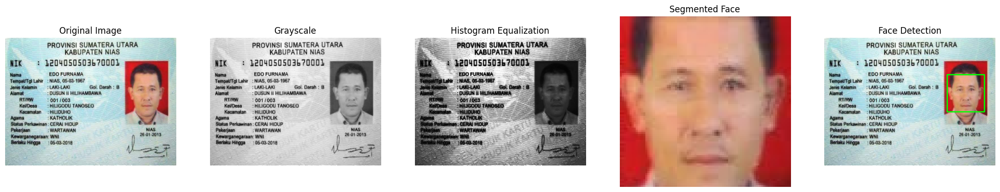

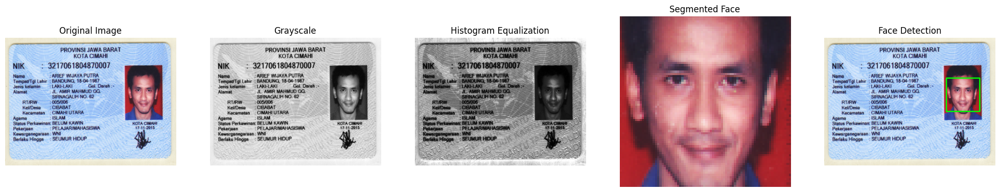

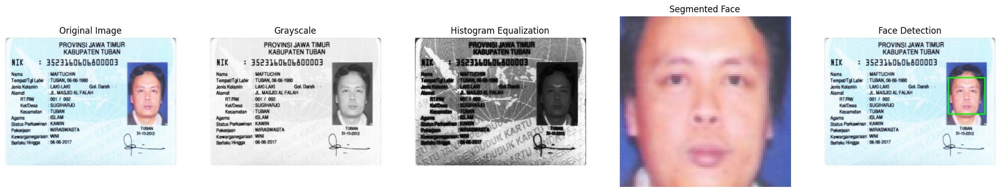

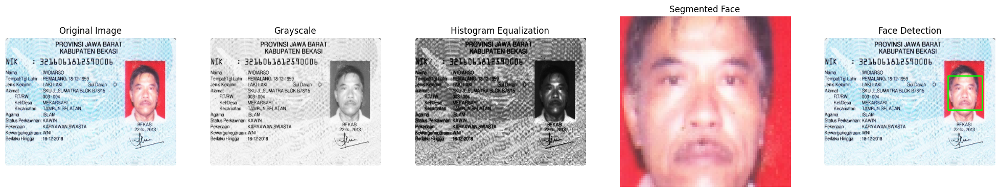

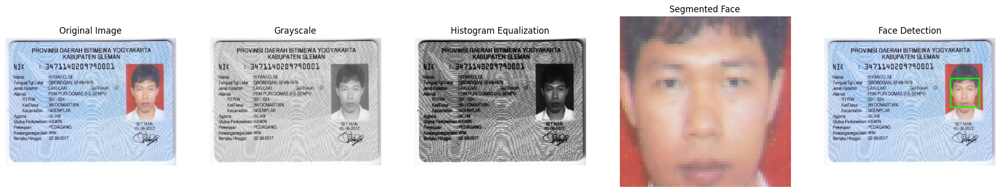

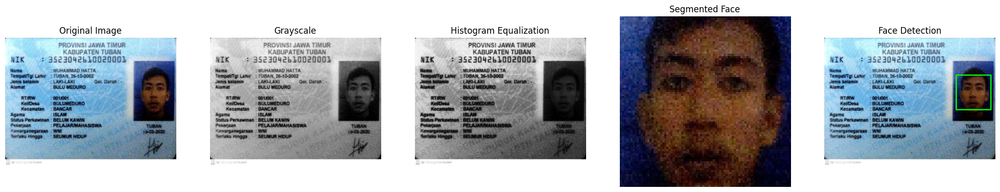

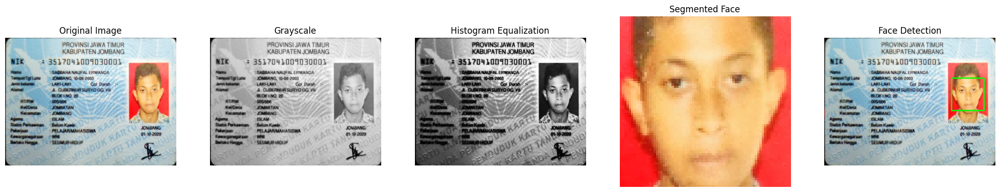

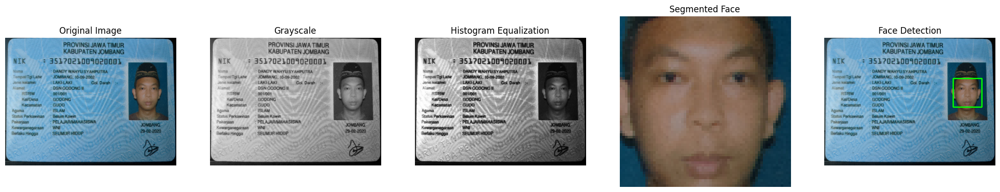

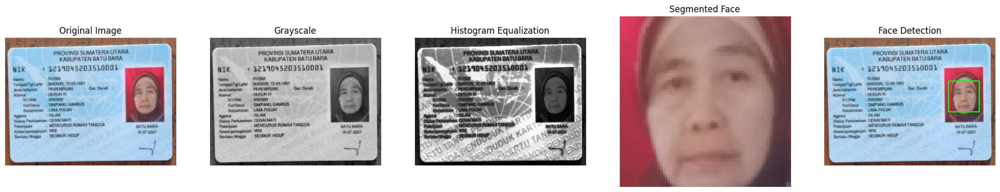

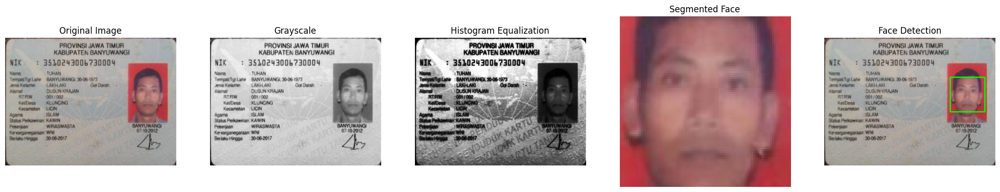

In [ ]:
# Loop melalui semua gambar dalam direktori
for i, img_file in enumerate(files, start=1):
    img_path = os.path.join(direct_data, img_file)
    img = cv2.imread(img_path)

    # PREPROCESSING
    # (1) Resize the image
    img = cv2.resize(img, (400, 300))

    # (2) Convert to Grayscale
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # (3) Histogram Equalization
    equalized_img = cv2.equalizeHist(gray_img)

    # (4) Lokalisasi (Face Detection)
    faces = cascade_wajah.detectMultiScale(img, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))

    # SEGEMENTASI DAN RECOGNIZATION
    for (x, y, w, h) in faces:
        # (5) Segmentasi (Crop Wajah)
        face_segment = img[y:y+h, x:x+w]

        # Tampilkan hasil segmentasi dan pengenalan wajah
        plt.figure(figsize=(25, 6))

        # Gambar asli
        plt.subplot(151)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title('Original Image')
        plt.axis('off')

        # Grayscale image (PREPROCESSING)
        plt.subplot(152)
        plt.imshow(gray_img, cmap='gray')
        plt.title('Grayscale')
        plt.axis('off')

        # Equalized Image (PREPROCESSING)
        plt.subplot(153)
        plt.imshow(equalized_img, cmap='gray')
        plt.title('Histogram Equalization')
        plt.axis('off')

        # Gambar Segmentasi Wajah
        plt.subplot(154)
        plt.imshow(cv2.cvtColor(face_segment, cv2.COLOR_BGR2RGB))
        plt.title('Segmented Face')
        plt.axis('off')

        # Gambar dengan kotak di sekitar wajah (Lokalisasi - Face Detection)
        img_with_boxes = img.copy()
        cv2.rectangle(img_with_boxes, (x, y), (x+w, y+h), (0, 255, 0), 2)
        plt.subplot(155)
        plt.imshow(cv2.cvtColor(img_with_boxes, cv2.COLOR_BGR2RGB))
        plt.title('Face Detection')
        plt.axis('off')

        plt.show()


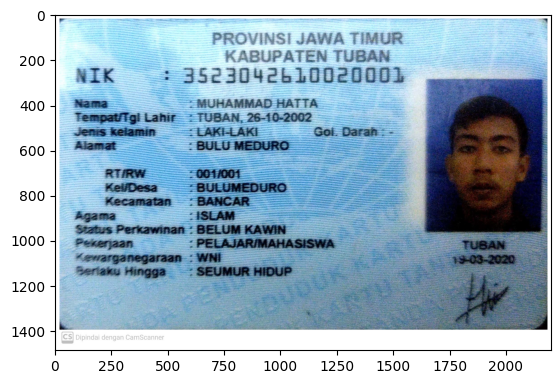

In [ ]:
ktp = cv2.imread('/content/drive/MyDrive/Kuliah/Semester 5/Machine Learning/Kuis 2/dataset/KTP8.jpg')
ktp = cv2.copyMakeBorder(
	src=ktp,
	top=20,
	bottom=20,
	left=20,
	right=20,
	borderType=cv2.BORDER_CONSTANT,
	value=(255, 255, 255))
plt.imshow(cv2.cvtColor(ktp, cv2.COLOR_BGR2RGB))
plt.axis('on')
plt.show()

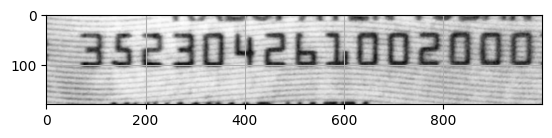

In [ ]:
ktp_gray = cv2.cvtColor(ktp, cv2.COLOR_BGR2GRAY)
ktp_blur = cv2.GaussianBlur(
                src=ktp_gray,
                ksize=(5, 5),
                sigmaX=0,
                sigmaY=0)
ktp_crop = ktp_blur[200:380, 500:1500]
plt.imshow(ktp_crop, cmap='gray')
plt.grid(True)
plt.show()

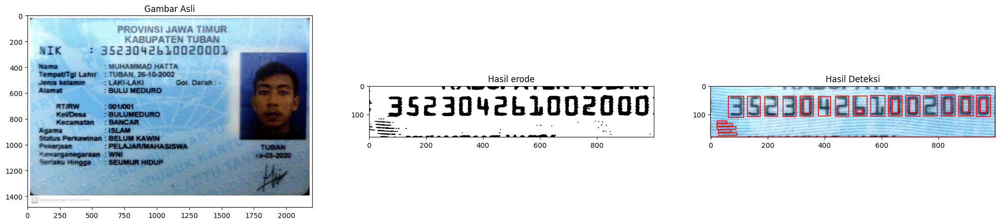

In [ ]:
output = ktp[200:380, 500:1500].copy()
clahe = cv2.createCLAHE(clipLimit=1.0, tileGridSize=(5,5))
gray = clahe.apply(ktp_crop)
ret, bw = cv2.threshold(gray.copy(), 100, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
# make more clear using closing
kernel = np.ones((3,3), np.uint8)
closing = cv2.morphologyEx(bw, cv2.MORPH_CLOSE, kernel, iterations=1)
dilate = closing.copy()



# Ekstraksi kontur
contours, hierarchy = cv2.findContours(dilate.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
# Looping contours untuk mendapatkan kontur yang sesuai
for cnt in contours:
    x, y, w, h = cv2.boundingRect(cnt)
    ras = format(w / h, '.2f')
    if h >= 40 and w >= 10 and float(ras) <= 1:
      cv2.rectangle(output, (x, y), (x + w, y + h), (0, 0, 255), thickness=2)
    elif h >= 8 and w >= 8 and float(ras) <= 10:
      cv2.rectangle(output, (x, y), (x + w, y + h), (0, 0, 255), thickness=2)
    elif h >= 10 and w >= 7 and float(ras) <= 8:
      cv2.rectangle(output, (x, y), (x + w, y + h), (0, 0, 255), thickness=2)

      # cv.drawContours(ktp, contours, -1, (0, 255, 0), 2)

# Menampilkan gambar KTP dengan kontur menggunakan plt
f, axarr = plt.subplots(1, 3, figsize=(25, 8))
axarr[0].imshow(cv2.cvtColor(ktp, cv2.COLOR_BGR2RGB))
axarr[0].set_title("Gambar Asli")
axarr[1].imshow(dilate, cmap='gray')
axarr[1].set_title("Hasil erode")
axarr[2].imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
axarr[2].set_title("Hasil Deteksi")
plt.show()

Ekstraksi data

In [ ]:
class KTPInformation(object):
    def __init__(self):
        self.nik = ""
        self.nama = ""
        self.tempat_lahir = ""
        self.tanggal_lahir = ""
        self.jenis_kelamin = ""
        self.golongan_darah = ""
        self.alamat = ""
        self.rt = ""
        self.rw = ""
        self.kelurahan_atau_desa = ""
        self.kecamatan = ""
        self.agama = ""
        self.status_perkawinan = ""
        self.pekerjaan = ""
        self.kewarganegaraan = ""
        berlaku_hingga = "SEMUR HIDUP"

In [ ]:
!sudo apt install tesseract-ocr
!pip install pytesseract

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 10 not upgraded.
Need to get 4,816 kB of archives.
After this operation, 15.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Fetched 4,816 kB in 2s (1,999 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debc

In [ ]:
import cv2
import json
import re
import numpy as np
import pytesseract
import matplotlib.pyplot as plt
from PIL import Image

class KTPOCR(object):
    def __init__(self, image):
        self.image = cv2.imread(image)
        self.gray = cv2.cvtColor(self.image, cv2.COLOR_BGR2GRAY)
        self.th, self.threshed = cv2.threshold(self.gray, 127, 255, cv2.THRESH_TRUNC)
        self.result = KTPInformation()
        self.master_process()

    def process(self, image):
        raw_extracted_text = pytesseract.image_to_string((self.threshed), lang="ind")
        return raw_extracted_text

    def word_to_number_converter(self, word):
        word_dict = {
            '|' : "1"
        }
        res = ""
        for letter in word:
            if letter in word_dict:
                res += word_dict[letter]
            else:
                res += letter
        return res


    def nik_extract(self, word):
        word_dict = {
            'b' : "6",
            'e' : "2",
        }
        res = ""
        for letter in word:
            if letter in word_dict:
                res += word_dict[letter]
            else:
                res += letter
        return res

    def extract(self, extracted_result):
        #print(extracted_result.replace('\n', ' -- '))
        for word in extracted_result.split("\n"):
            if "NIK" in word:
                word = word.split(':')
                self.result.nik = self.nik_extract(word[-1].replace(" ", ""))
                continue

            if "Nama" in word:
                word = word.split(':')
                self.result.nama = word[-1].replace('Nama ','')
                continue

            if "Tempat" in word:
                word = word.split(':')
                self.result.tanggal_lahir = re.search("([0-9]{2}\-[0-9]{2}\-[0-9]{4})", word[-1])[0]
                self.result.tempat_lahir = word[-1].replace(self.result.tanggal_lahir, '')
                continue

            if 'Darah' in word:
                self.result.jenis_kelamin = re.search("(LAKI-LAKI|LAKI|LELAKI|PEREMPUAN)", word)[0]
                word = word.split(':')
                try:
                    self.result.golongan_darah = re.search("(O|A|B|AB)", word[-1])[0]
                except:
                    self.result.golongan_darah = '-'
            if 'Alamat' in word:
                self.result.alamat = self.word_to_number_converter(word).replace("Alamat ","")
            if 'NO.' in word:
                self.result.alamat = self.result.alamat + ' '+word
            if "Kecamatan" in word:
                self.result.kecamatan = word.split(':')[1].strip()
            if "Desa" in word:
                wrd = word.split()
                desa = []
                for wr in wrd:
                    if not 'desa' in wr.lower():
                        desa.append(wr)
                self.result.kelurahan_atau_desa = ''.join(wr)
            if 'Kewarganegaraan' in word:
                self.result.kewarganegaraan = word.split(':')[1].strip()
            if 'Pekerjaan' in word:
                wrod = word.split()
                pekerjaan = []
                for wr in wrod:
                    if not '-' in wr:
                        pekerjaan.append(wr)
                self.result.pekerjaan = ' '.join(pekerjaan).replace('Pekerjaan', '').strip()
            if 'Agama' in word:
                self.result.agama = word.replace('Agama',"").strip()
            if 'Perkawinan' in word:
                self.result.status_perkawinan = word.split(':')[1]
            if "RT/RW" in word:
                word = word.replace("RT/RW",'')
                self.result.rt = word.split('/')[0].strip()
                self.result.rw = word.split('/')[1].strip()

    def master_process(self):
        raw_text = self.process(self.image)
        self.extract(raw_text)

    def to_json(self):
        return json.dumps(self.result.__dict__, indent=4)

In [ ]:
!sudo apt-get install tesseract-ocr-ind

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following NEW packages will be installed:
  tesseract-ocr-ind
0 upgraded, 1 newly installed, 0 to remove and 10 not upgraded.
Need to get 537 kB of archives.
After this operation, 1,138 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-ind all 1:4.00~git30-7274cfa-1.1 [537 kB]
Fetched 537 kB in 2s (286 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 78, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Selecting previously unselected package tesseract-ocr-ind.
(Reading databa

In [ ]:
#LEGACY VERSION

import cv2
import numpy as np
import pytesseract
import matplotlib.pyplot as plt
from PIL import Image
import sys

## (1) Read
def read(ktp_path):
    img = cv2.imread(ktp_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    ## (2) Threshold
    th, threshed = cv2.threshold(gray, 127, 255, cv2.THRESH_TRUNC)

    ## (3) Detect
    result = pytesseract.image_to_string((threshed), lang="ind")

    final = []

    ## (5) Normalize
    for word in result.split("\n"):
        if "”—" in word:
            word = word.replace("”—", ":")

        #normalize NIK
        if "NIK" in word:
            nik_char = word.split()
        #if "D" in word:
        #    word = word.replace("D", "0")
        if "?" in word:
            word = word.replace("?", "7")

        final.append(word)
    return final

if __name__ == "__main__":
    try:
        ktppath = '/content/drive/MyDrive/Kuliah/Semester 5/Machine Learning/Kuis 2/dataset/ktp.png'
    except:
        ktppath = None
        print('Define your image path. Example: python ocr.py /path/of/image.jpg')
    if ktppath:
        ocr = KTPOCR(ktppath)
        word = ocr.to_json()
        print(word)

{
    "nik": "34711140209790001",
    "nama": "RIYANTO. SE",
    "tempat_lahir": " GROBOGAN. ",
    "tanggal_lahir": "02-09-1979",
    "jenis_kelamin": "LAKI-LAKI",
    "golongan_darah": "-",
    "alamat": "PRM PURI DOMAS D-3. SEMPU",
    "rt": "",
    "rw": "",
    "kelurahan_atau_desa": "WEDOMARTANI!",
    "kecamatan": "NGEMPLAK",
    "agama": "\"ISLAM",
    "status_perkawinan": "",
    "pekerjaan": ": PEDAGANG",
    "kewarganegaraan": "WNI HI \u2014"
}



Processing image: ktp5.png


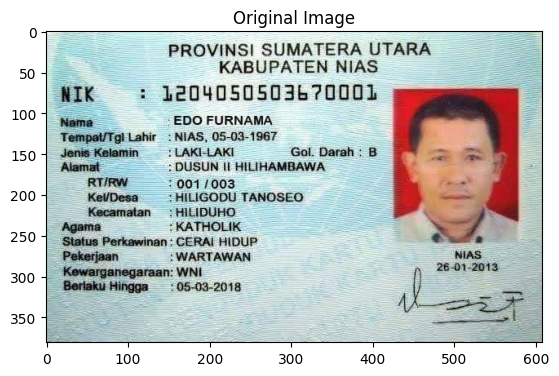

PROVINSI SUMATERA UTARA
KABUPATEN NIAS

NIK 1 12010505036 70001

Nama EDO FURNAMA
Tempat/Tgl Lahir: NIAS, 05-03-1967
Jenis Kelamin: LAKI-LAKI Gol. Darah : B 3:
Alamat : DUSUN II HILIHAMBAWA

RTIRW 001/003

Kel/Desa HILIGODU TANOSEO

Kecamatan : HILIDUHO
Agama KATHOLIK RN 4
Status Perkawinan: CERAI HIDUP Li .
Pekerjaan : WARTAWAN NIAS
Kewarganegaraan: WNI mena aoi
Berlaku Hingga — :05-03-2018 |

——35

8 —
5
|


Processing image: ktp2.png


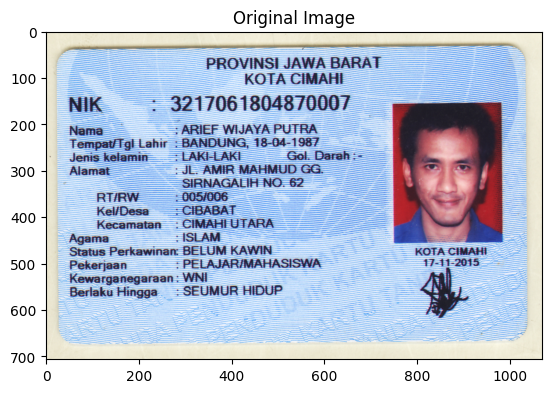

PROVINSI JAWA BARAT

 

KOTA CIMAHI
NIK : 3217061804870007
Nama 1 ARIEF WIJAYA PUTRA
Tempat/Tgi Lahir : BANDUNG, 18-04-1987
Jenis kelamin : LAKI-LAKI Gol. Darah :-
Alamat : JL. AMIR MAHMUD GG.
SIRNAGALIH NO. 62

RT/RW 1005/2006

Kel/Desa : CIBABAT

Kecamatan : CIMAHI UTARA
Agama : ISLAM
Status Perkawinan: BELUM KAWIN KOTA CIMAHI
Pekerjaan : PELAJAR/MAHASISWA 17-11-2015
Kewarganegaraan : WNI

Berlaku Hingga

: SEUMUR HIDUP


Processing image: ktp3.png


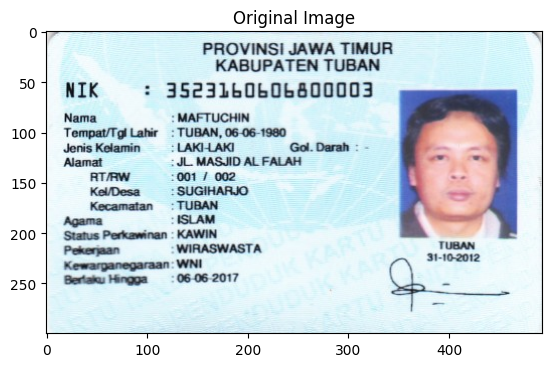

PROVINSI JAWA TIMUR
KABUPATEN TUBAN

NIK: 3523150404800003
Nama MArTUCHIN
Tompat/Tgi Lahir TUBAN, 05.06 1980
Jenis Kolamin LAKI LAKI Got Daran
Mamat IL MASJID AL FALAH
BTAW 0011 002
KolDesa — SUGIHARIO 5 8
Kecamatan — TUBAN
ISLAM 8 Y
Kawi

 

WIRASWASTA tuBAN
kewarganegaraan WNI — Arweoi

Berak Hungga 06 06 2017

 


Processing image: ktp6.png


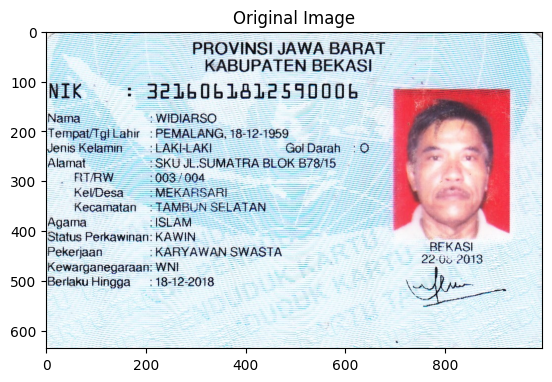

PROVINSI JAWA BARAT
KABUPATEN BEKASI

NIK 1 30160b1012590006 en
Nama : WIDIARSO #
Tempat/Tgl Lahir : PEMALANG, 18-12-1959
Jenis Kelamin : LAKI-LAKI Gol Darah : 0
Alamat :SKU JLLSUMATRA BLOK B78/15
RTRW 0903 004
Kel/Desa : MEKARSARI 3
Kecamatan: TAMBUN SELATAN
Agama :ISLAM
Status Perkawinan: KAWIN
Pekerjaan KARYAWAN SWASTA Aa

22-6u 2013
Kewarganegaraan: WNI tua
Berlaku Hingga :18-12-2018 N Jo

 

-———


Processing image: ktp.png


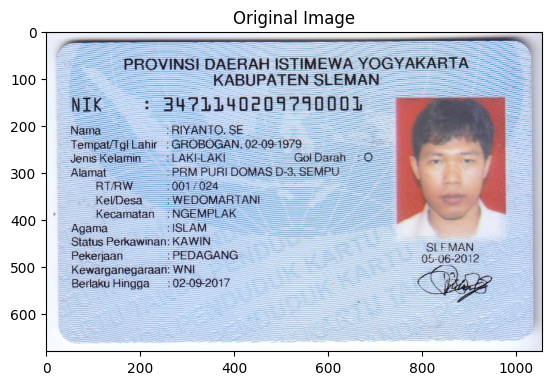

em

PROVINSI DAERAH ISTIMEWA YOGYAKARTA
KABUPATEN SLEMAN

 

NIK : 34711140209790001

Nama :RIYANTO. SE

Tempat/Tgl Lahir : GROBOGAN. 02-09-1979

Jenis Kelamin : LAKI-LAKI Gol Darah : 0

Alamat PRM PURI DOMAS D-3. SEMPU
RTRW 1001 1024

Kel/Desa : WEDOMARTANI!
Kecamatan : NGEMPLAK

Agama "ISLAM
Status Bean KAWIN SLEMAN
Pekerjaan : PEDAGANG 05-06-2012

Kewarganegaraan: WNI HI —
Berlaku Hingga :02-09-2017 NIA

   
 

 


Processing image: KTP8.jpg


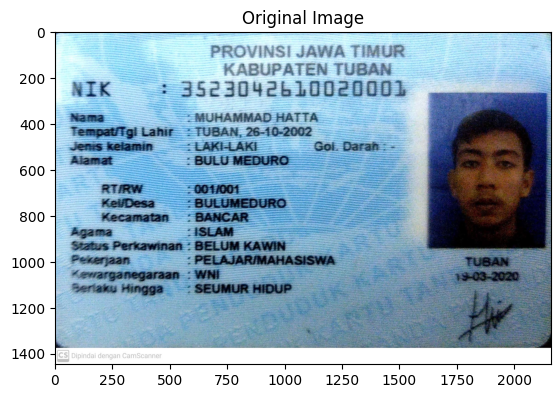

“IK : 3523012510020001
Gama . MUHAMMAD HATTA
Tempatitgi Lahir : TUBAN, 26-10-2002
jerns kelamin LAKI-LAKI Soi. Darah . -
Alamat 1 BULU MEDURO
RTRW : GO HOO1
KoifDesa : BULUMEDURO
Kecamatan  BANCAR
Agama ISLAM
Teatus Perkawinan : BELUM KAWIN
Pewarnaan ' PELAJAR/MAHASISWA

« rsargaregaraan | Wi
serak Jingga —— SEUMUR HIDUP

 


Processing image: ktp7.jpeg


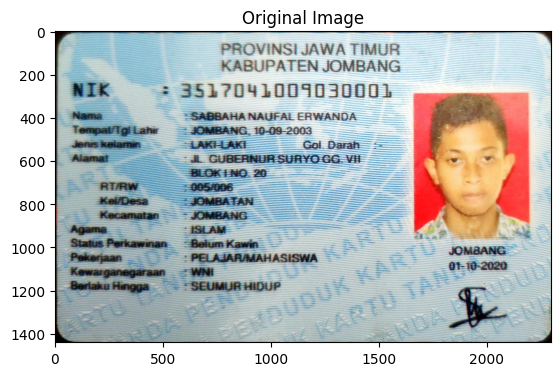

 

“ TN Tr NX SAKIT,
Ia Le k - A 4 RA: LAI '
Ai: A SN JUMBANG

NIK 2: 3547 an490 30001

Nama SABBA HA NAUFA: ERWANDA
Tempat'Tgi Late JOMBANG. 10-09-2003 :
deras Kelarran — : Goi Darah -:
Alamat GUBERNUR SURYOGS. AR
aa 25 55
RTRW D5 :
KaeiDesa : JOMBA TAN
Kecamatan — JOMBANG
Agama ISLAM
Status Perkawman —— Belum Kawan
Pekerjaan PELAJAR/MAHASISWA

va

a

Ba

k

« 1

3 f
k F f :

JOMBANG
01- 0-2020

IX


Processing image: ktp-nenek.jpeg


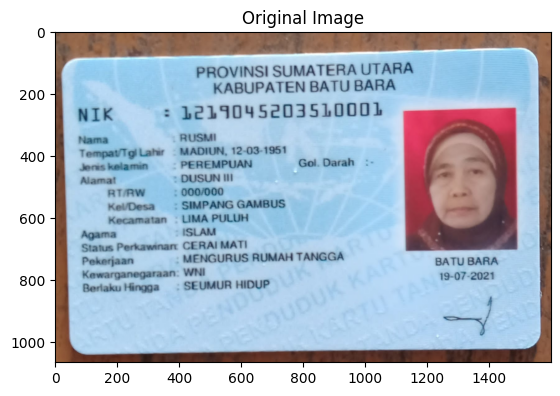

: a 4 ia “. Leg : a

PE aa ARA

| PROVINSI SUMATERA UTARA
KABUPATEN BATU BARA

NIK 1219045203510001

Hama RUSMI
ampat Tg Lah: MADIUN 12 03 1951
kn an umi man PEREMPUAN Go! Darah
Alamaf DUSUN III
1 NW 000/000
KP Desa SIMPANG GAMBUS
. LIMA PULUH
Agama SLAM
Status Perkawnan CERAI MATI
Pekerjaan MENGURUS RUMAH TANGGA
BATU BARA

” FX. -
Ge ep TR

     

Kawarganegataan WNI
19-07 2021

Beraku tangga SEUMUR HIDUP


Processing image: ktp-tuhan.jpeg


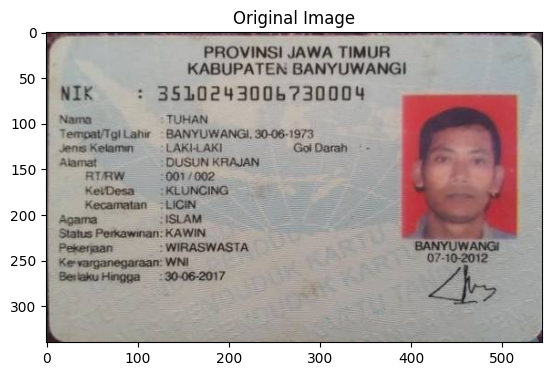

PROVINSI JAWA TIMUR
KABUPATEN BANYUWANGI

     
   
   
   
 

NIK 3510230067 30004
Nama TumaN
Son Tgi Lahu — BANYUWANGI, 30061973
Aa naa LARI AKI Calaran
DUSUN KAAJAN NE
aw 001 Oo

 

kekDesa — KLUNCING
Kecamatan “LICIN

Agama ISLAM
Status Perkawinan: KAWIN
Pekerjaan WIRASWASTA

Ke-varganegaraan: WNI
Beriaku Hingga 3006-2017

 


Processing image: ktpDandy.jpg


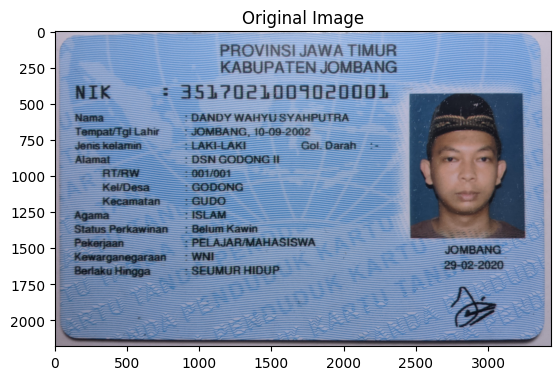

PROVINSI JAWA TIMUR
KABUPATEN JOMBANG

NIK : 45170011009000004

  
 
  
 
  

Nama "BANDY WAHYU SYAHPUTRA
Tempat'Tgi Lahir "SOMBANG, 10-09-2002
Jjeris kelaran YAKHAKI Got. Darah

Alamat ——— : DSN GODONGHI



In [ ]:
# LEGACY VERSION

import os
import cv2
import numpy as np
import pytesseract
import matplotlib.pyplot as plt
from PIL import Image
import sys

class KTPOCR:
    def __init__(self, image_folder):
        self.image_folder = image_folder

    def process_image(self, image_path):
        img = cv2.imread(image_path)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        ## (2) Threshold
        th, threshed = cv2.threshold(gray, 127, 255, cv2.THRESH_TRUNC)

        ## (3) Detect
        result = pytesseract.image_to_string(threshed, lang="ind")

        final = []

        ## (5) Normalize
        for word in result.split("\n"):
            if "”—" in word:
                word = word.replace("”—", ":")

            # normalize NIK
            if "NIK" in word:
                nik_char = word.split()
            if "?" in word:
                word = word.replace("?", "7")

            final.append(word)

        return final, img

    def display_info(self):
        for filename in os.listdir(self.image_folder):
            if filename.endswith(('.jpg', '.png', '.jpeg')):
                image_path = os.path.join(self.image_folder, filename)
                print(f"\nProcessing image: {filename}")
                extracted_data, image = self.process_image(image_path)

                # Display the original image
                plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
                plt.title('Original Image')
                plt.show()

                # Display extracted data
                for item in extracted_data:
                    print(item)

if __name__ == "__main__":
    try:
        image_folder = '/content/drive/MyDrive/Kuliah/Semester 5/Machine Learning/Kuis 2/dataset/'
    except:
        image_folder = None
        print('Define your image folder path. Example: python ocr.py /path/of/image/folder')
    if image_folder:
        ocr = KTPOCR(image_folder)
        ocr.display_info()
